In [1]:
import sys
import numpy as np
from astropy.io import fits
from aspired import image_reduction
from aspired import spectral_reduction
import plotly.io as pio
pio.renderers.default = 'notebook'

/usr/local/lib/python3.7/site-packages/tqdm/autonotebook/__init__.py:18: TqdmExperimentalWarning:

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)



/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:292: UserWarning:

saxis keyword "SAXIS" is not in the header. saxis is set to 1.

/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:526: UserWarning:

No bias frames. Bias subtraction is not performed.

/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:542: UserWarning:

No flat frames. Field-flattening is not performed.



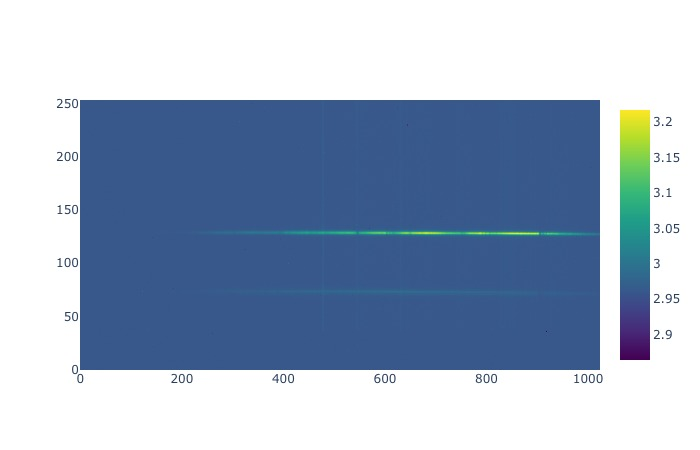

In [2]:
science_frame = image_reduction.ImageReduction('sprat_LHS6328.list')
science_frame.reduce()
science_frame.inspect(renderer='jpg')
#science_frame.savefits(overwrite=True)

/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:292: UserWarning:

saxis keyword "SAXIS" is not in the header. saxis is set to 1.

/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:526: UserWarning:

No bias frames. Bias subtraction is not performed.

/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:542: UserWarning:

No flat frames. Field-flattening is not performed.



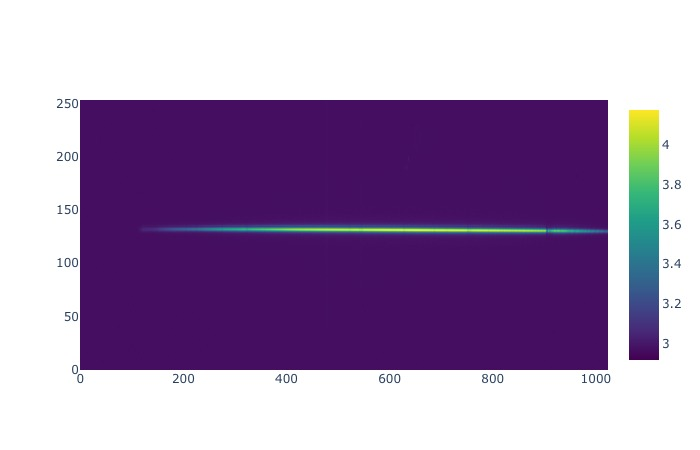

In [3]:
standard_frame = image_reduction.ImageReduction('sprat_Hiltner102.list')
standard_frame.reduce()
standard_frame.inspect(renderer='jpg')

In [4]:
# Set the spectral direction is defaulted to saxis=1
#saxis = 1

# initialise the two aspired.TwoDSpec()
lhs6328 = spectral_reduction.TwoDSpec(
    science_frame,
    cosmicray=False
)
hilt102 = spectral_reduction.TwoDSpec(
    standard_frame,
    cosmicray=False
)

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:208: UserWarning:

Read Noise value cannot be identified. It is set to 0.



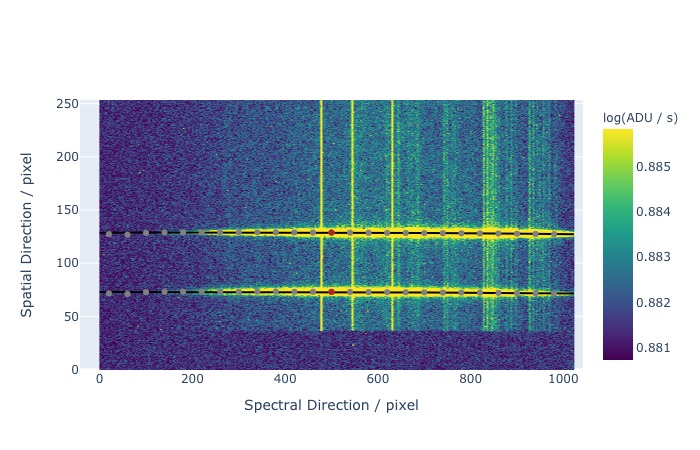

In [5]:
# automatically trace the spectrum
lhs6328.ap_trace(nspec=2, renderer='jpg', display=True)

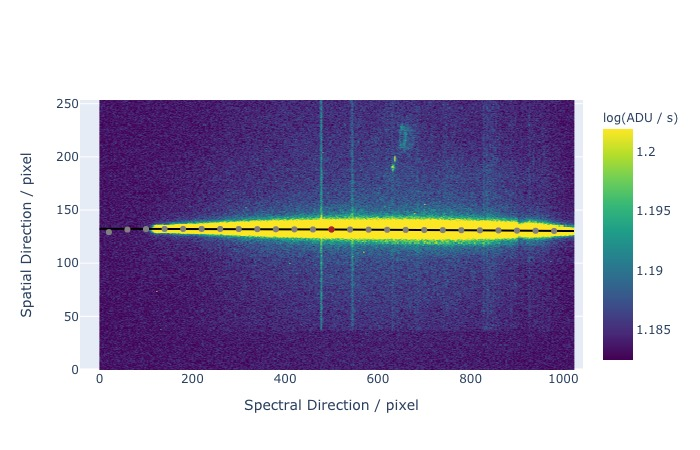

In [6]:
hilt102.ap_trace(nspec=1, renderer='jpg', display=True)

In [7]:
# Uncomment this to supply trace(s) manually, this overwrites the traces found with ap_trace.
# All these should work
#lhs6328.add_trace([np.ones(1024)*130., np.ones(1024)*70.], 5.)
#lhs6328.add_trace(np.ones(1024)*130., 5.)
#lhs6328.add_trace([np.ones(1024)*130.], 5.)
#lhs6328.add_trace([np.ones(1024)*130.], [5.])

# Optimal extracting spectrum by summing over the aperture along the trace
lhs6328.ap_extract(
    apwidth=15,
    optimal=True,
    skywidth=10,
    skydeg=1,
    display=True,
    jsonstring=False)

In [8]:
hilt102.ap_extract(
    apwidth=25,
    skysep=3,
    skywidth=5,
    skydeg=1,
    optimal=True,
    display=True,
    jsonstring=False)

In [9]:
lhs6328.save_fits(filename='lhs6328_adu_traces', overwrite=True)
hilt102.save_fits(filename='hilt102_adu_traces', overwrite=True)

[<astropy.io.fits.hdu.image.ImageHDU object at 0x123ec0950>, <astropy.io.fits.hdu.image.ImageHDU object at 0x123ec0b50>, <astropy.io.fits.hdu.image.ImageHDU object at 0x123e45c10>, <astropy.io.fits.hdu.image.ImageHDU object at 0x123ec0d10>, <astropy.io.fits.hdu.image.ImageHDU object at 0x123eba610>]
[<astropy.io.fits.hdu.image.ImageHDU object at 0x123ec0b10>, <astropy.io.fits.hdu.image.ImageHDU object at 0x123ec0c90>, <astropy.io.fits.hdu.image.ImageHDU object at 0x121064e10>, <astropy.io.fits.hdu.image.ImageHDU object at 0x123ffab90>, <astropy.io.fits.hdu.image.ImageHDU object at 0x123ece710>]


In [10]:
# Placeholder of wavelength calibration
onedspec = spectral_reduction.OneDSpec()
onedspec.add_twodspec(lhs6328, stype='science')
onedspec.add_twodspec(hilt102, stype='standard')

In [11]:
onedspec.add_arc(science_frame, stype='science')
onedspec.add_arc(standard_frame, stype='standard')

/usr/local/lib/python3.7/site-packages/numpy/core/fromnumeric.py:745: UserWarning:




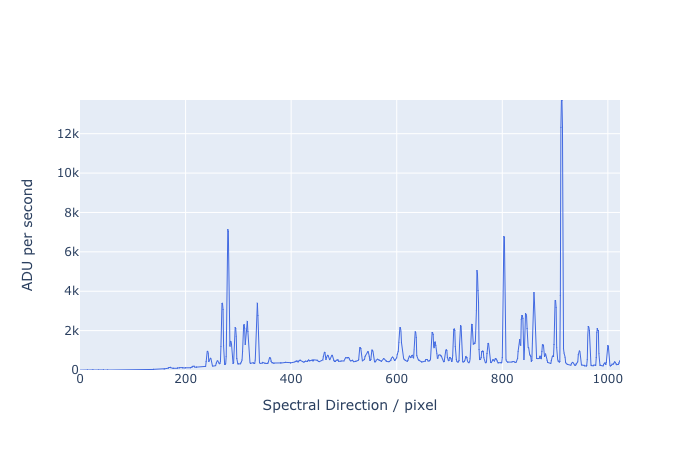

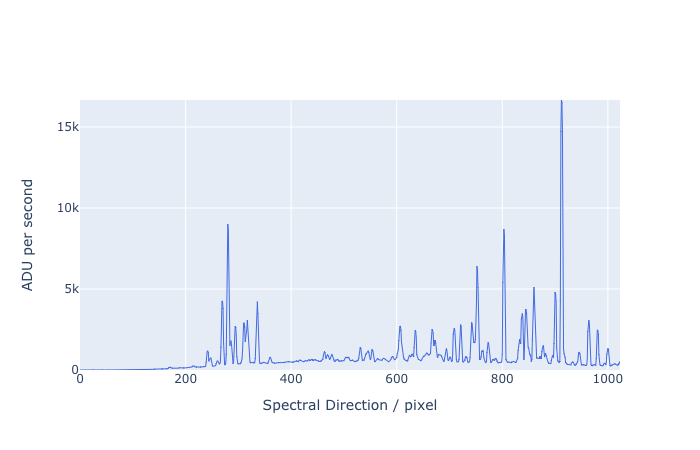

In [12]:
# Apply the spec_mask to arc
onedspec.apply_twodspec_mask(stype='science')
onedspec.apply_twodspec_mask(stype='standard')
# Find the arc lines, first by subtracting the ADU value at 20-th percentile, as a crude background subtraction
# A minimum of 5 pixels between lines
onedspec.extract_arc_spec(renderer='png', display=True, stype='science')

[ 151  170  181  191  203  215  234  242  260  269  280  286  294  302
  311  317  328  336  347  360  365  373  395  409  416  426  433  439
  445  463  469  478  486  495  508  514  524  530  546  553  564  575
  591  607  624  629  635  657  668  673  681  694  700  709  721  731
  742  747  752  763  773  787  794  803  821  837  844  860  868  876
  882  900  912  932  946  963  974  980  995 1000 1013]


/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:1996: RuntimeWarning:

invalid value encountered in log10



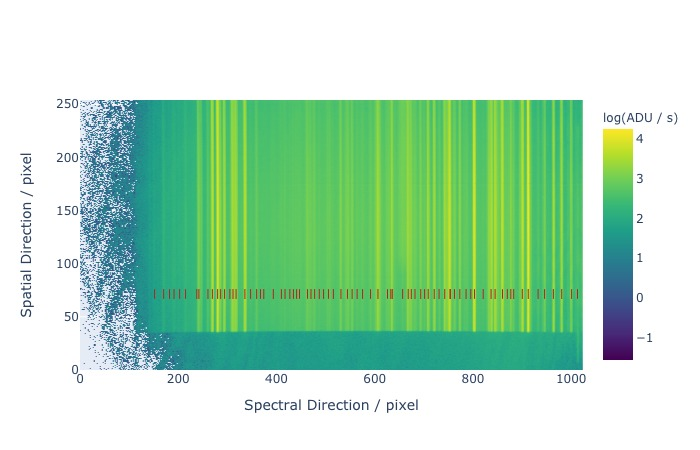

[ 151  170  182  191  203  214  242  248  260  270  280  286  294  310
  317  326  336  347  359  376  395  409  417  427  433  439  445  450
  463  469  477  487  495  504  509  515  525  531  546  553  564  574
  592  606  624  629  635  651  657  662  667  673  681  694  701  709
  721  731  742  747  752  763  773  787  803  813  821  832  838  844
  860  871  878  895  900  912  932  945  954  964  973  980  993 1000
 1012]


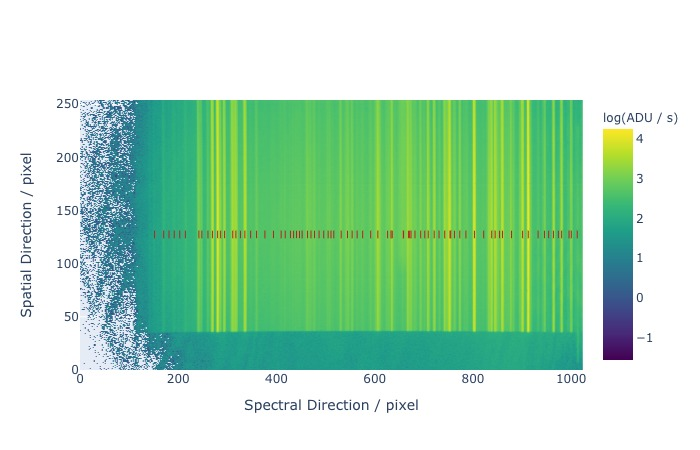

In [13]:
onedspec.find_arc_lines(percentile=20., distance=5., renderer='jpg', display=True, stype='science')

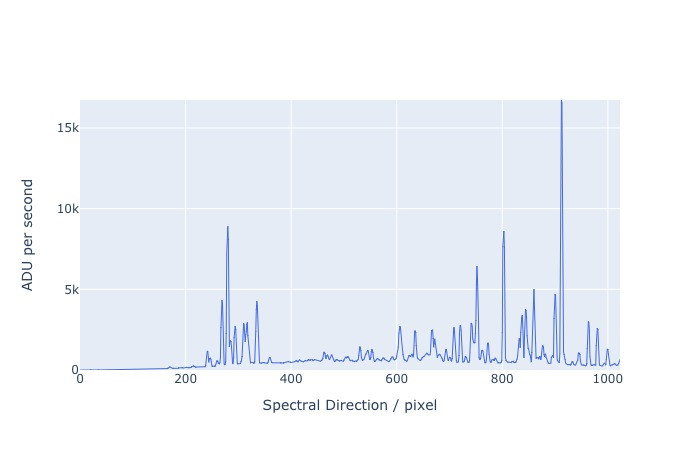

In [14]:
onedspec.extract_arc_spec(renderer='jpg', display=True, stype='standard')

[ 143  151  162  170  182  191  202  214  221  233  242  252  259  269
  280  285  294  301  310  317  327  335  347  360  376  395  409  416
  432  439  444  462  469  477  487  495  507  515  522  530  545  553
  564  574  590  606  617  623  629  634  657  668  680  694  700  709
  720  730  741  747  752  763  773  781  786  793  803  813  821  832
  838  844  860  865  871  876  882  895  900  912  926  932  945  953
  963  973  980  994  999 1012]


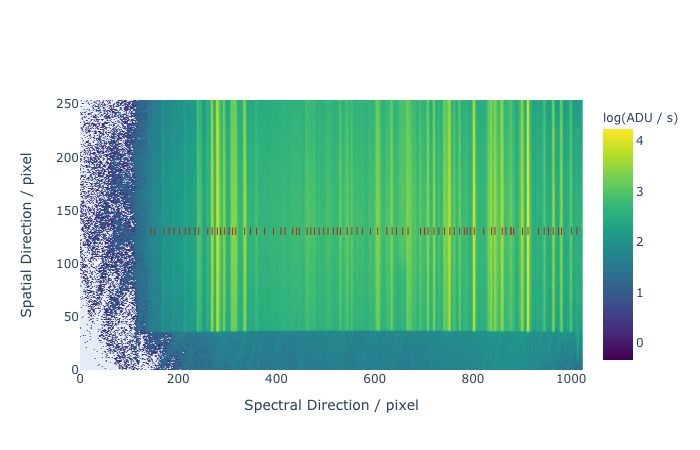

In [15]:
onedspec.find_arc_lines(percentile=20., distance=5., renderer='jpg', display=True, stype='standard')

In [16]:
onedspec.fit(elements=["Xe"], candidate_thresh=10., display=False, stype='science')
onedspec.refine_fit(elements=["Xe"], tolerance=20., display=False, stype='science')
onedspec.refine_fit(elements=["Xe"], tolerance=10., display=False, stype='science')
onedspec.refine_fit(elements=["Xe"], tolerance=5., display=True, stype='science')

INFO:rascal.calibrator:Peak at: 3951.018748938142 A
INFO:rascal.calibrator:- matched to 3950.92 A
INFO:rascal.calibrator:Peak at: 4049.0291884387716 A
INFO:rascal.calibrator:Peak at: 4111.625942154384 A
INFO:rascal.calibrator:Peak at: 4159.102243509773 A
INFO:rascal.calibrator:Peak at: 4218.176093122159 A
INFO:rascal.calibrator:Peak at: 4280.301572952953 A
INFO:rascal.calibrator:Peak at: 4396.383136275648 A
INFO:rascal.calibrator:Peak at: 4418.265637458601 A
INFO:rascal.calibrator:Peak at: 4511.20395952638 A
INFO:rascal.calibrator:Peak at: 4556.333472139058 A
INFO:rascal.calibrator:Peak at: 4609.507302930942 A
INFO:rascal.calibrator:Peak at: 4640.17882344533 A
INFO:rascal.calibrator:Peak at: 4679.514912948833 A
INFO:rascal.calibrator:Peak at: 4732.975627974647 A
INFO:rascal.calibrator:Peak at: 4764.349379670541 A
INFO:rascal.calibrator:Peak at: 4795.1373717378365 A
INFO:rascal.calibrator:Peak at: 4883.312680309412 A
INFO:rascal.calibrator:Peak at: 4939.917374834215 A
INFO:rascal.calibr

INFO:rascal.calibrator:Peak at: 4053.30914487034 A
INFO:rascal.calibrator:Peak at: 4142.2397720997105 A
INFO:rascal.calibrator:Peak at: 4193.689288573731 A
INFO:rascal.calibrator:- matched to 4193.5 A
INFO:rascal.calibrator:Peak at: 4243.66597952988 A
INFO:rascal.calibrator:Peak at: 4296.61313503436 A
INFO:rascal.calibrator:Peak at: 4350.458562859087 A
INFO:rascal.calibrator:Peak at: 4479.3835575732965 A
INFO:rascal.calibrator:Peak at: 4507.663718774184 A
INFO:rascal.calibrator:Peak at: 4565.794650500357 A
INFO:rascal.calibrator:Peak at: 4607.822992093965 A
INFO:rascal.calibrator:Peak at: 4657.422837816613 A
INFO:rascal.calibrator:Peak at: 4685.948128100351 A
INFO:rascal.calibrator:Peak at: 4722.9162203704245 A
INFO:rascal.calibrator:Peak at: 4800.078196113342 A
INFO:rascal.calibrator:Peak at: 4829.628624311132 A
INFO:rascal.calibrator:- matched to 4829.71 A
INFO:rascal.calibrator:Peak at: 4872.468979021057 A
INFO:rascal.calibrator:Peak at: 4914.410500932104 A
INFO:rascal.calibrator:Pe

In [17]:
onedspec.add_polyfit(
    pfit_coeff=np.array((3.5170e+03, 3.7037e+00, 1.9541e-03, -1.8412e-06, 9.8740e-10, -2.6048e-13)), stype='standard')
onedspec.refine_fit(elements=["Xe"], tolerance=10., display=False, stype='standard')
onedspec.refine_fit(elements=["Xe"], tolerance=5., display=True, stype='standard')

INFO:rascal.calibrator:Peak at: 4081.756701598194 A
INFO:rascal.calibrator:Peak at: 4113.918411975494 A
INFO:rascal.calibrator:Peak at: 4193.169638407755 A
INFO:rascal.calibrator:- matched to 4193.5 A
INFO:rascal.calibrator:Peak at: 4240.305116688916 A
INFO:rascal.calibrator:Peak at: 4283.315704114081 A
INFO:rascal.calibrator:Peak at: 4330.476383813662 A
INFO:rascal.calibrator:Peak at: 4382.251787793568 A
INFO:rascal.calibrator:Peak at: 4417.682804097668 A
INFO:rascal.calibrator:Peak at: 4468.61573529053 A
INFO:rascal.calibrator:Peak at: 4502.541011248209 A
INFO:rascal.calibrator:Peak at: 4583.678898452533 A
INFO:rascal.calibrator:- matched to 4582.75 A
INFO:rascal.calibrator:Peak at: 4623.140889669483 A
INFO:rascal.calibrator:Peak at: 4670.719315271322 A
INFO:rascal.calibrator:- matched to 4671.23 A
INFO:rascal.calibrator:Peak at: 4699.163525754939 A
INFO:rascal.calibrator:Peak at: 4733.6446209155165 A
INFO:rascal.calibrator:- matched to 4734.15 A
INFO:rascal.calibrator:Peak at: 4777.

In [18]:
onedspec.apply_wavelength_calibration(stype='science')
onedspec.apply_wavelength_calibration(stype='standard')

In [19]:
print("RMS of the fit: " + str(onedspec.wavecal_science.rms) + "\n")
print("Polyfit coefficient: " + str(onedspec.wavecal_science.pfit_coeff) + "\n")
print("Fraction of peaks used for wavelength calibration:" + str(onedspec.wavecal_science.peak_utilisation) + "\n\n")

print("RMS of the fit: " + str(onedspec.wavecal_standard.rms) + "\n")
print("Polyfit coefficient: " + str(onedspec.wavecal_standard.pfit_coeff) + "\n")
print("Fraction of peaks used for wavelength calibration:" + str(onedspec.wavecal_standard.peak_utilisation) + "\n")

RMS of the fit: [1.931237570717064, 2.453398995775867]

Polyfit coefficient: [array([ 3.09833375e+03,  5.98842823e+00, -2.83963934e-03,  2.84842392e-06,
       -1.03725267e-09]), array([ 3.29975984e+03,  5.19493289e+00, -1.87830053e-03,  2.55978647e-06,
       -1.12035864e-09])]

Fraction of peaks used for wavelength calibration:[0.4805194805194805, 0.41975308641975306]


RMS of the fit: [2.1566926709880816]

Polyfit coefficient: [array([ 3.50037782e+03,  3.82764357e+00,  1.59973436e-03, -1.31741906e-06,
        5.58734439e-10, -1.07666869e-13])]

Fraction of peaks used for wavelength calibration:[0.6329113924050633]



/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:2626: UserWarning:

The request standard star cannot be found in the given library, using irafirscal instead.



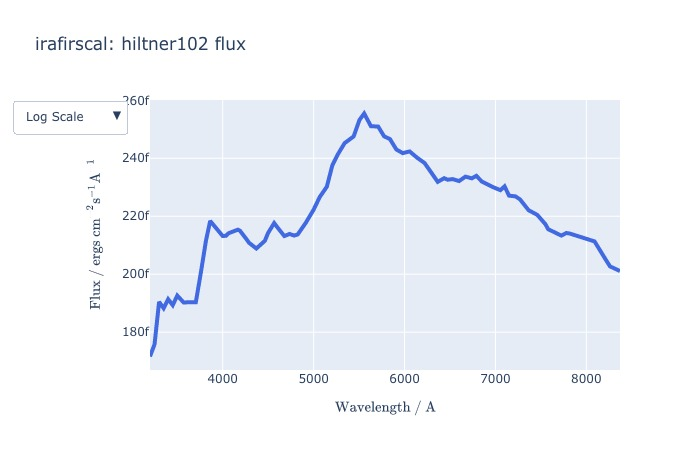

In [20]:
onedspec.load_standard(
    target='hiltner102',
    library='irafirs',
    cutoff=0.4,
    ftype='flux',
    display=False
)
onedspec.inspect_standard(renderer='jpg')

In [21]:
# Get the sensitivity curves
onedspec.compute_sensitivity(kind='cubic')
onedspec.inspect_sensitivity()

In [22]:
onedspec.add_twodspec(lhs6328, stype='science')
onedspec.apply_flux_calibration('science')

In [23]:
onedspec.add_twodspec(hilt102, stype='standard')
onedspec.apply_flux_calibration('standard')

In [24]:
onedspec.inspect_reduced_spectrum('science')

In [25]:
onedspec.inspect_reduced_spectrum('standard')

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:3383: RuntimeWarning:

invalid value encountered in greater

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:3385: RuntimeWarning:

invalid value encountered in less



In [26]:
#lhs6328_reduced.save_fits(stype='all', overwrite=True)

In [27]:
# Without flux calibration here
lhs6328_no_flux = spectral_reduction.OneDSpec()
lhs6328_no_flux.add_twodspec(lhs6328, stype='science')
lhs6328_no_flux.add_twodspec(hilt102, stype='standard')

lhs6328_no_flux.add_arc(science_frame, stype='science')
lhs6328_no_flux.add_arc(standard_frame, stype='standard')

lhs6328_no_flux.apply_twodspec_mask(stype='science')
lhs6328_no_flux.apply_twodspec_mask(stype='standard')

lhs6328_no_flux.extract_arc_spec(renderer='png', display=False, stype='science')
lhs6328_no_flux.extract_arc_spec(renderer='png', display=False, stype='standard')

lhs6328_no_flux.find_arc_lines(percentile=20., distance=5., renderer='jpg', display=False, stype='science')
lhs6328_no_flux.find_arc_lines(percentile=20., distance=5., renderer='jpg', display=False, stype='standard')

lhs6328_no_flux.fit(elements=["Xe"], candidate_thresh=10., display=False, stype='science')
lhs6328_no_flux.refine_fit(elements=["Xe"], tolerance=5., display=False, stype='science')

lhs6328_no_flux.fit(elements=["Xe"], candidate_thresh=10., display=False, stype='standard')
lhs6328_no_flux.refine_fit(elements=["Xe"], tolerance=5., display=False, stype='standard')

lhs6328_no_flux.apply_wavelength_calibration(stype='science')
lhs6328_no_flux.apply_wavelength_calibration(stype='standard')

lhs6328_no_flux.inspect_reduced_spectrum('science+standard')

[ 151  170  181  191  203  215  234  242  260  269  280  286  294  302
  311  317  328  336  347  360  365  373  395  409  416  426  433  439
  445  463  469  478  486  495  508  514  524  530  546  553  564  575
  591  607  624  629  635  657  668  673  681  694  700  709  721  731
  742  747  752  763  773  787  794  803  821  837  844  860  868  876
  882  900  912  932  946  963  974  980  995 1000 1013]
[ 151  170  182  191  203  214  242  248  260  270  280  286  294  310
  317  326  336  347  359  376  395  409  417  427  433  439  445  450
  463  469  477  487  495  504  509  515  525  531  546  553  564  574
  592  606  624  629  635  651  657  662  667  673  681  694  701  709
  721  731  742  747  752  763  773  787  803  813  821  832  838  844
  860  871  878  895  900  912  932  945  954  964  973  980  993 1000
 1012]
[ 143  151  162  170  182  191  202  214  221  233  242  252  259  269
  280  285  294  301  310  317  327  335  347  360  376  395  409  416
  432  439  4

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:3271: UserWarning:

Flux calibration is not available.



/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:3391: UserWarning:

Flux calibration is not available.



In [28]:
# Without standard observation here
lhs6328_no_standard = spectral_reduction.OneDSpec()
lhs6328_no_standard.add_twodspec(lhs6328, stype='science')

lhs6328_no_standard.add_arc(science_frame, stype='science')
lhs6328_no_standard.apply_twodspec_mask(stype='science')
lhs6328_no_standard.extract_arc_spec(renderer='png', display=False, stype='science')
lhs6328_no_standard.find_arc_lines(percentile=20., distance=5., renderer='jpg', display=False, stype='science')
lhs6328_no_standard.fit(elements=["Xe"], candidate_thresh=10., display=False, stype='science')
lhs6328_no_standard.refine_fit(elements=["Xe"], tolerance=5., display=False, stype='science')
lhs6328_no_standard.apply_wavelength_calibration(stype='science')

lhs6328_no_standard.inspect_reduced_spectrum('science')

[ 151  170  181  191  203  215  234  242  260  269  280  286  294  302
  311  317  328  336  347  360  365  373  395  409  416  426  433  439
  445  463  469  478  486  495  508  514  524  530  546  553  564  575
  591  607  624  629  635  657  668  673  681  694  700  709  721  731
  742  747  752  763  773  787  794  803  821  837  844  860  868  876
  882  900  912  932  946  963  974  980  995 1000 1013]
[ 151  170  182  191  203  214  242  248  260  270  280  286  294  310
  317  326  336  347  359  376  395  409  417  427  433  439  445  450
  463  469  477  487  495  504  509  515  525  531  546  553  564  574
  592  606  624  629  635  651  657  662  667  673  681  694  701  709
  721  731  742  747  752  763  773  787  803  813  821  832  838  844
  860  871  878  895  900  912  932  945  954  964  973  980  993 1000
 1012]
